# LMECA2300: Advanced Numerical Methods
## Assignment 5

**Students:**
- Student 1: Victor Lepère (61502000)
- Student 2: Max Opdecam(77062000)

In this assignement, we will implement the multipole decomposition method for analyzing how a radiated field from a point A behaves around a decentered point B. It basically consists of considering the Fourier series of the Hankel function and substituting the resulting cosine terms using the Anger-Jacobi formula. This yields:
$$
H_0^{(2)} (k R) = \frac{1}{2 \pi} \sum_\beta \sum_l H_l^{(2)} (k R_0) \epsilon(l) (-j)^l \cos (l (\beta - \phi_0)) e^{-j k \bold{\mu}_\beta \cdot \bold r_0}
$$
Where the two sums represent discretization using $M$ and $N$ values resp. In the implementation, we will use instances of class `Point` to represent A and B. Furthermore, the `integrate_decenter` method implements the multipole decomposition w.r.t. a obserber point given as argument, relying on the above discretization.

In [13]:
### Imports
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.animation
from scipy.special import hankel2
from math import ceil

### Physical constants
rho0 = 1.2 # air, 20°C, 1 atm
f = 100 # [hz]
w = 2*np.pi*f # air -> 343 = w/k
k = w/343
lambda_ = (2*np.pi)/k
    
class Point:
    def __init__(self,x,y):
        self.x = np.asarray(x)
        self.y = np.asarray(y)
    def integrate_gen(self, Vn, obs):
        """
        Integrates for general observer ,point source.

        @param Vn: constant normal velocity
        @param obs: coord. of observer (or vector of coords)
        """
        obs = np.atleast_2d(obs) # (N,2)
        
        diff = obs - (self.x,self.y)
        rho = np.linalg.norm(diff, axis=-1) # (N,m)
        H = hankel2(0, k * rho) # (N,m)
        
        if np.any(np.isnan(H)):
            raise ValueError("Hankel function evaluated at singular point, change geometry or grid.")
        integral = w * rho0 * Vn  * H/4 # (N,)
        return integral
    def integrate_decenter(self,P_obs,Vn, obs, m=50, n=21):
        """
        Integrates for decenter observer ,point source.

        @param Vn: constant normal velocity
        @param obs: coord. of observer (or vector of coords)
        @param 
        """
        def e(l):
            if l==0:
                return 1
            return 2
        beta = np.linspace(0, 2*np.pi,m)
        l = np.arange(0,n,1)
        obs = np.atleast_2d(obs) # (N,2)
        
        R0 = np.linalg.norm((self.x-P_obs.x,self.y-P_obs.y))
        phi0 = np.arctan2(P_obs.y-self.y,P_obs.x-self.x)
        #print(phi0*180/3.14)
        r0 = obs - (P_obs.x,P_obs.y) # (N,2)
        temp = np.zeros((n,len(r0)),dtype=complex)
        temp2 = np.zeros((m,len(r0)),dtype=complex)
        for i in range(len(beta)):
            u_beta = [np.cos(beta[i]), np.sin(beta[i])]
            for j in l:
                temp[j,:] = hankel2(j, k * R0)*e(l[j])*((-1j)**l[j])*np.cos(l[j]*(beta[i]-phi0))*np.exp(1j * k * (np.asarray(r0) @ np.asarray(u_beta))) # (n,N)
                #print(temp)
            temp2[i,:] = np.sum(temp,axis = 0)  #(m,N)
            #print(temp2)
        H = np.sum(temp2,axis=0)
        if np.any(np.isnan(H)):
            raise ValueError("Hankel function evaluated at singular point, change geometry or grid.")
        integral = w * rho0 * Vn  * H/4 /(2*np.pi) # (N,)
        return integral

Find below an example where $A = (-10 \lambda, -10 \lambda)$ and $B = (0, 0)$ that shows the resulting computed pressure field. We display a $4 \lambda \times 4 \lambda$ domain around the observer 

In [18]:
point_source = Point(-10*lambda_, -10*lambda_)
point_obs = Point(0,0)
gridsize = 50
x = np.linspace(-2*lambda_, 2*lambda_, gridsize)
X, Y = np.meshgrid(x, x)
coord_array = np.column_stack((X.ravel(), Y.ravel()))
grid_integrals = point_source.integrate_decenter(point_obs,1, coord_array)
#grid_integrals = point_source.integrate_gen(1, coord_array)

plt.rcParams["animation.html"] = "jshtml"
plt.ioff()
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
delta_t = (1/f)/10

pressures = np.real(grid_integrals * np.exp(1j*w*0*delta_t))
surf = ax.plot_surface(X, Y, pressures.reshape(X.shape),cmap=cm.coolwarm)
ax.set_xlim(-2*lambda_, 2*lambda_)
ax.set_ylim(-2*lambda_, 2*lambda_)
ax.set_zlim(-200, 200)
ax.set_title("Pressure field total")
fig.tight_layout()
def animate(t):
    global surf
    surf.remove()
    pressures = np.real(grid_integrals * np.exp(1j*w*t*delta_t))
    surf = ax.plot_surface(X, Y, pressures.reshape(X.shape),cmap=cm.coolwarm)
    fig.tight_layout()
    return(surf,)
    
matplotlib.animation.FuncAnimation(fig, animate, frames=50, interval=100)

To assess the correctness of the derived approximation, we will compare it with the method used in the previous assignments.
Our comparison metric will rely on the relative complex error defined as:
$$
\text{error} = \frac{|P - P^*|}{|P^*|}
$$
We indeed directly compare the complex phasors between each other to avoid time dependency. We first consider the same scenario of the previous example and analysis the impact of the discretization of $\beta$ on the accuracy of the result.

In [ ]:
nb_points = np.arange(10, 100, 10)
errors = np.zeros_like(nb_points)
for i in range(len(nb_points)):
    grid_vanilla = point_source.integrate_gen(1, coord_array)
    grid_multipole = point_source.integrate_decenter(point_obs, 1, coord_array, m=nb_points[i])

    errors[i] = np.mean(np.abs(grid_multipole - grid_vanilla)/np.abs(grid_vanilla))

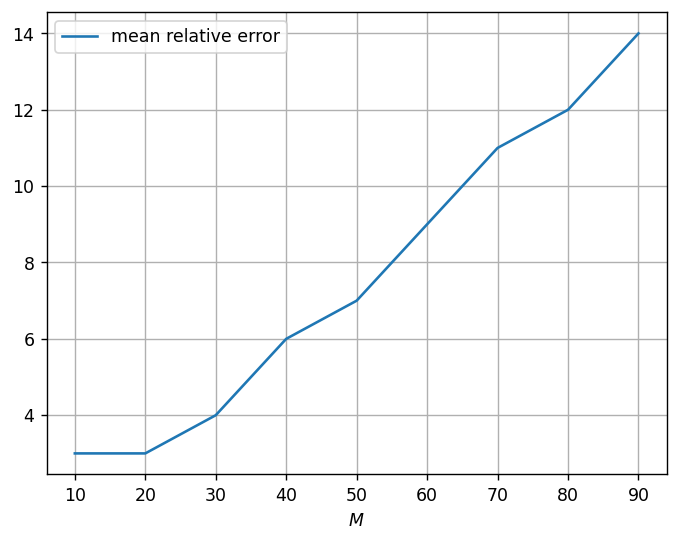

In [28]:
plt.plot(nb_points, errors, label="mean relative error")
plt.legend()
plt.grid()
plt.xlabel("$M$")
plt.show()